In [1]:
from gensim.models import KeyedVectors
import tweepy

import json
import pandas as pd
import numpy as np

import glob
import os

from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
%matplotlib inline 
from sklearn.decomposition import PCA

In [2]:
wv_from_bin = KeyedVectors.load_word2vec_format("GoogleNews-vectors-negative300.bin", binary=True)


In [3]:
wv_from_bin.most_similar("Sagittarius")

[('Pisces', 0.6788645386695862),
 ('Virgo', 0.6245872974395752),
 ('Taureans', 0.5865582823753357),
 ('Sagittarian', 0.5852836966514587),
 ('Uranus', 0.5832427144050598),
 ('Libra', 0.5822854042053223),
 ('Capricorn', 0.574246346950531),
 ('Ophiuchus', 0.5715441703796387),
 ('zodiac_sign', 0.5649268627166748),
 ('YOUR_HOROSCOPE', 0.5595555901527405)]

In [42]:
list_words = ["animal", "donkey"]
np.mean(wv_from_bin[list_words], axis=0)

array([ 0.17495728,  0.09579468, -0.24511719,  0.12084961, -0.00512695,
       -0.09197998,  0.11340332, -0.05895996, -0.05187988, -0.05871582,
        0.14453125, -0.30200195, -0.10449219, -0.11541748, -0.29101562,
       -0.00634766, -0.25585938,  0.03320312, -0.1574707 , -0.13586426,
        0.0567627 , -0.04760742,  0.22509766,  0.13085938, -0.05322266,
       -0.04534912, -0.15527344,  0.21679688,  0.3857422 , -0.23535156,
       -0.1126709 , -0.07287598, -0.02441406,  0.00732422, -0.09643555,
        0.09570312,  0.03857422,  0.05822754,  0.00366211,  0.16326332,
        0.05993652, -0.03466797, -0.02001953,  0.13464355, -0.0703125 ,
       -0.14367676,  0.07470703,  0.17041016,  0.10083008,  0.05761719,
       -0.10336304,  0.02539062,  0.1418457 , -0.04284668, -0.01940918,
        0.00848389,  0.19970703, -0.06340027,  0.19702148,  0.15995026,
        0.05929565,  0.0447998 , -0.00427246, -0.17089844,  0.01184082,
       -0.33203125,  0.08251953,  0.15258789, -0.19921875, -0.07

# Hashtag Embeddings

### Reading the data

In [72]:
df = pd.read_csv("tweets.csv", lineterminator='\n')

In [73]:
print(f"Number of English tweets: {df.shape[0]}")
print(f"Number of unique users: {len(df.author_name.unique())}")

Number of English tweets: 404688
Number of unique users: 265019


In [12]:
df.head()

,id,author_name,author_screen_name,original_text,hashtags,user_mentions
0,28965157874962433,Alex Cronin (Gregg),wonderg1rl,@ClaraBearer Wondergirl to the rescue! Ha. I'm...,NaN,[ClaraBearer]
1,28965155291271168,BeenBaald,_BlAkAmberRosE,@TWERKandTWEET he is 2,NaN,[TWERKANDTWEET]
2,28965135238303744,Heller,Heller,@BeasBookNook every ARC I've ever read hasn't ...,NaN,[BeasBookNook]
3,28965148181929984,Maximus,BlindMaximus,@marshallsheldon Have you met @princepinchi? H...,NaN,"[marshallsheldon, princepinchi, pirulofurry]"
4,28965142993571840,black girl magic ✨✨✨,CRYaboutitNIGGA,@pound3lb got wat right ?,NaN,NaN


### Creating the embeddings using Word2Vec Google model

In [75]:
# Gather only tweets which have hashtags associated
df_hashtags = df[~df["hashtags"].isna()]
print(df_hashtags.shape)
df_hashtags.head()

(62621, 8)


,Unnamed: 0,id,author_name,author_screen_name,original_text,filtered_tweet_text,hashtags,user_mentions
13,13,28965134948896768,AJ,goldendragon35,RT @ZodiacFacts: #ZodiacFacts #Sagittarius hav...,rt : zodiacfacts sagittarius have enormous con...,"['ZodiacFacts', 'Sagittarius']",['ZodiacFacts']
18,18,28965137255768066,Jaguar Paw,Jydough,#np Preacher Man - Asa... #GreatMusic,np preacher man - asa... greatmusic,"['np', 'GreatMusic']",NaN
20,20,28965141634613248,Stormsale,stormsale,Check our FB promo to #win #free stuff: http:/...,check our fb promo to win free stuff: http://w...,"['win', 'free', 'ski', 'ski', 'snowboarding']",NaN
33,33,28965179723091968,Johnny Dollaz,Johnnydollaz,#FuckedUpTweet lol RT @BellaMichele My Dad ask...,fuckeduptweet lol rt my dad ask me to make him...,['FuckedUpTweet'],['BellaMichele']
35,35,28965167886761984,TalkingTeenage,TalkingTeenage,Teen Talk Tip of the Day: Remember ur teen yrs...,teen talk tip of the day: remember ur teen yrs...,"['parenting', 'teens', 'moms', 'dads', 'ukmums...",NaN


#### Filtering out Out-Of-Vocabulary (OOV) hashtags

In [26]:
# Function to filter the out-of-vocabulary words
def filter_fn(row):
    doc = [word for word in row.hashtags if word in wv_from_bin.key_to_index]
    if(doc == []): return False
    else: return True

m = df_hashtags.apply(filter_fn, axis=1)

In [27]:
df_filtered_hashtags = df_hashtags[m]

In [32]:
df_filtered_hashtags.shape

(62620, 7)

In [28]:
# Create the hashtag embeddings
hashtag_embeddings = []
for i, r in df_filtered_hashtags.iterrows():
    doc = [word for word in r.hashtags if word in wv_from_bin.key_to_index]
    hashtag_embeddings.append(np.mean(wv_from_bin[doc], axis=0))

In [29]:
hashtag_embeddings = np.array(hashtag_embeddings)

### Elbow clustering to find number of clusters

In [67]:
distortions = []
K = range(10,25)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(hashtag_embeddings)
    distortions.append(kmeanModel.inertia_)

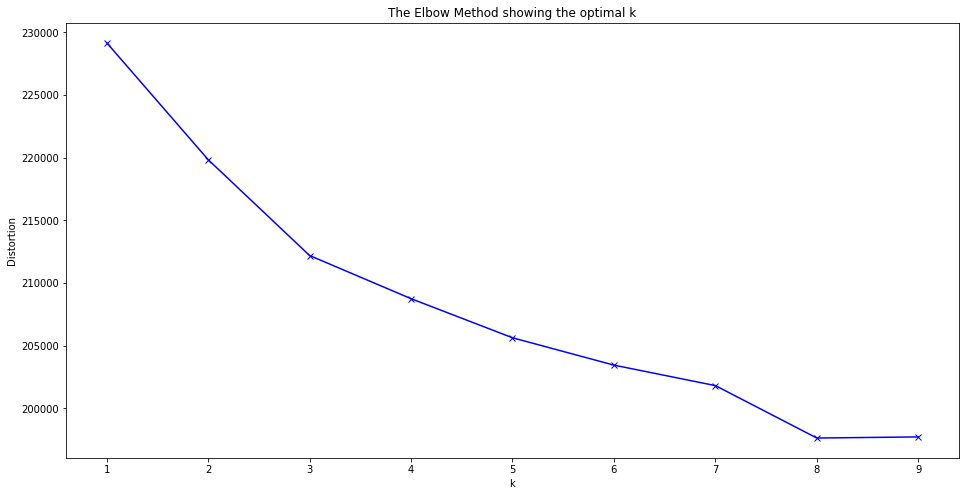

In [66]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

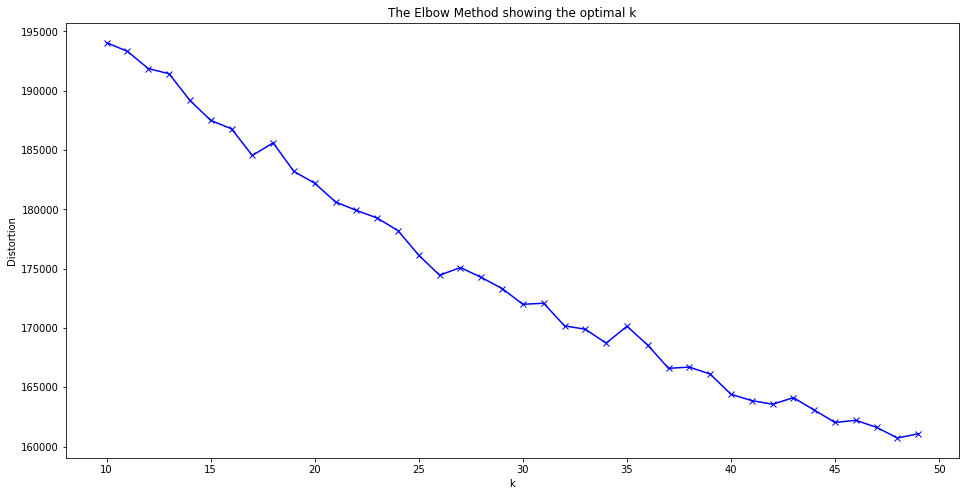

In [69]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

### Using random state parameter for consistent result


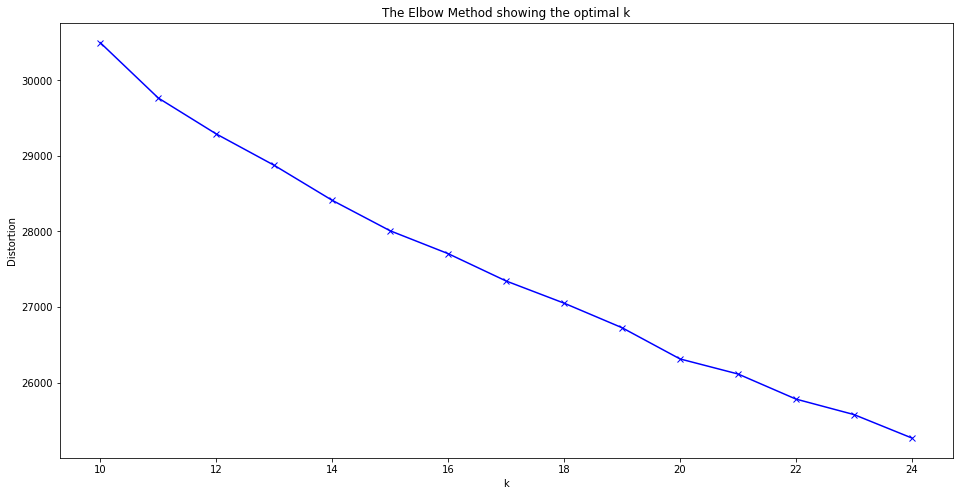

In [35]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

### KMeans to actually cluster

In [54]:
kmeans = KMeans(n_clusters=16, random_state=0).fit(hashtag_embeddings)
print(kmeans.inertia_)

27705.783203125


In [55]:
len(kmeans.labels_)

62620

### Visualize a sample of tweets

#### Dimensionality reduction

In [56]:
pca = PCA(n_components=3)
result = pca.fit_transform(hashtag_embeddings)

In [57]:
print(len(result))
print(len(hashtag_embeddings))
print(len(df_filtered_hashtags.original_text.tolist()))

62620
62620
62620


In [58]:
## concatenate labels to df
df_filtered_hashtags["labels"] = kmeans.labels_

<ipython-input-58-9379a5c9fd12>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_hashtags["labels"] = kmeans.labels_


In [67]:
df_filtered_hashtags[df_filtered_hashtags.labels == 6]

,Unnamed: 0,id,author_name,author_screen_name,original_text,hashtags,user_mentions,labels
18,18,28965137255768066,Jaguar Paw,Jydough,#np Preacher Man - Asa... #GreatMusic,"['np', 'GreatMusic']",NaN,6
33,33,28965179723091968,Johnny Dollaz,Johnnydollaz,#FuckedUpTweet lol RT @BellaMichele My Dad ask...,['FuckedUpTweet'],['BellaMichele'],6
91,91,28965282747781120,Las Vegas Poker,PokerLasVegas,7:00 PM @ Binion's Poker Room $100 No-Limit Ho...,"['Poker', 'Vegas', 'LasVegas']",['BinionsLV'],6
93,93,28965257883947008,Guillermo Ace,OsGuillermo,True Relationship = No Secret + No Lies. #Dam...,['DamnItsTrue'],NaN,6
156,156,28965384791003136,The Black Chandler,ToroHanzo,#WhyYoPussySmellLike a wet rag,['WhyYoPussySmellLike'],NaN,6
...,...,...,...,...,...,...,...,...
404329,404329,29689367261872128,Sales Of The Day,SalesOfTheDay,1080P Home Theater HDMI Projector #Wii PS3 DVD...,"['Wii', 'Sale']",NaN,6
404404,404404,29689519187955712,Newsday Business,NewsdayBiz,Treasury to auction Citigroup warrants: WASHIN...,['Newsday'],NaN,6
404521,404521,29689634497765376,treens,KatrinaDevene,#DontTrustHer if her name is Kat Stacks .,['DontTrustHer'],NaN,6
404522,404522,29689699027128320,Sheena,s_town,New Avril track & video is SHIT. #NoSurprise.,['NoSurprise'],NaN,6


In [96]:
df_filtered_hashtags.labels.value_counts()

4     7006
3     3705
7     3007
1     2840
5     2492
8     2393
15    1613
12    1154
9      883
10     797
14     756
2      583
11     404
0      395
6      157
13     148
Name: labels, dtype: int64

In [100]:
df_filtered_hashtags.head()

,id,author_name,author_screen_name,original_text,hashtags,user_mentions,labels
13,28965134948896768,AJ,goldendragon35,RT @ZodiacFacts: #ZodiacFacts #Sagittarius hav...,"[ZodiacFacts, Sagittarius]",[ZodiacFacts],2
18,28965137255768066,Jaguar Paw,Jydough,#np Preacher Man - Asa... #GreatMusic,"[np, GreatMusic]",NaN,1
20,28965141634613248,Stormsale,stormsale,Check our FB promo to #win #free stuff: http:/...,"[win, free, ski, ski, snowboarding]",NaN,4
35,28965167886761984,TalkingTeenage,TalkingTeenage,Teen Talk Tip of the Day: Remember ur teen yrs...,"[parenting, teens, moms, dads, ukmums, family]",NaN,5
41,28965188979916801,Cicely THIGHson 🦵🏾,Crim5onViolet,I kinda want a can of ravioli #Random,[Random],NaN,8


# Visualization

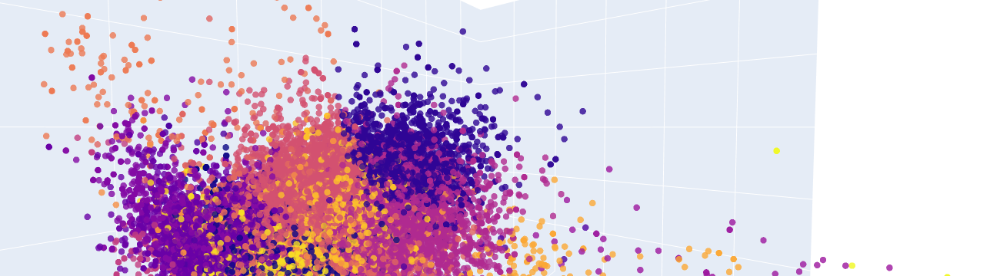

In [71]:
import plotly.graph_objects as go
import numpy as np

fig = go.Figure(data=[go.Scatter3d(
    x=result[:, 0],
    y=result[:, 1],
    z=result[:, 2],
    mode='markers',
    marker=dict(
        size=5,
        color=kmeans.labels_,                # set color to an array/list of desired values
#         colorscale='Viridis',   # choose a colorscale
        opacity=0.8 
        
    ),
    text=df_filtered_hashtags.hashtags.to_list(),
    hoverinfo="text"
    
)])

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()